In [37]:
import os
import pandas as pd
import numpy as np
import PIL.Image as Image, PIL.ImageDraw as ImageDraw, PIL.ImageFont as ImageFont
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [10]:
train_df = pd.read_csv('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/train.csv')
test_df = pd.read_csv('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/test.csv')
class_map_df = pd.read_csv('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/class_map.csv')
sample_sub_df = pd.read_csv('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/sample_submission.csv')

In [69]:
train_df.head()


,image_id,grapheme_root,vowel_diacritic,consonant_diacritic,grapheme
0,Train_0,15,9,5,ক্ট্রো
1,Train_1,159,0,0,হ
2,Train_2,22,3,5,খ্রী
3,Train_3,53,2,2,র্টি
4,Train_4,71,9,5,থ্রো


In [36]:
train_df.dtypes

image_id               object
grapheme_root           int64
vowel_diacritic         int64
consonant_diacritic     int64
grapheme               object
dtype: object

In [7]:
test_df.head()

,row_id,image_id,component
0,Test_0_consonant_diacritic,Test_0,consonant_diacritic
1,Test_0_grapheme_root,Test_0,grapheme_root
2,Test_0_vowel_diacritic,Test_0,vowel_diacritic
3,Test_1_consonant_diacritic,Test_1,consonant_diacritic
4,Test_1_grapheme_root,Test_1,grapheme_root


In [8]:
class_map_df.head()

,component_type,label,component
0,grapheme_root,0,ং
1,grapheme_root,1,ঃ
2,grapheme_root,2,অ
3,grapheme_root,3,আ
4,grapheme_root,4,ই


In [11]:
#Size of given data

print(f"Training data size: {train_df.shape}")
print(f"Testing data size: {test_df.shape}")
print(f"Class Map data size: {class_map_df.shape}")

Training data size: (200840, 5)
Testing data size: (36, 3)
Class Map data size: (186, 3)


In [13]:
#Distinct number of instances of the three classes - grapheme roots, vowel diacritics and consonant diacritics
print(f"Distinct numbers: {train_df.nunique()}")

Distinct Grapheme Roots: image_id               200840
grapheme_root             168
vowel_diacritic            11
consonant_diacritic         7
grapheme                 1295
dtype: int64


In [16]:
print(f"Distinct number of graphme root: {train_df['grapheme_root'].nunique()}")
print(f"Distinct number of vowel diacritic: {train_df['vowel_diacritic'].nunique()}")
print(f"Distinct number of consonant diacritic: {train_df['consonant_diacritic'].nunique()}")

Distinct number of graphme root: 168
Distinct number of vowel diacritic: 11
Distinct number of consonant diacritic: 7


In [8]:
HEIGHT = 236
WIDTH = 236

In [56]:
def get_top_n(df, field, n, top = True):
    df_name = 'top_'+str(field)
    indices = 'top_'+str(field)+'_indices'
    counts = 'top_'+str(field)+'_counts'
    df_name = df.groupby([field]).size().reset_index(name='counts')['counts'].sort_values(ascending = not top)[:n]
    indices = df_name.index
    counts = df_name.values
    df_name = class_map_df[class_map_df['component_type'] == 'grapheme_root'].reset_index().iloc[indices]
    df_name.drop(['component_type', 'label'], axis=1, inplace=True)
    df_name.loc[:,'count'] = counts
    return df_name


In [59]:
#counts of each class - here it shows top 10 grapheme roots
grapheme_roots = get_top_n(train_df, 'grapheme_root', 10)
grapheme_roots

,index,component,count
72,72,দ,5736
64,64,ত,5596
13,13,ক,5420
107,107,ব,5321
23,23,গ,5149
96,96,প,4926
113,113,ভ,4395
147,147,স,4392
133,133,শ,4374
115,115,ম,4015


In [67]:
def image_from_char(char):
    image = Image.new('RGB', (WIDTH, HEIGHT))
    draw = ImageDraw.Draw(image)
    myfont = ImageFont.truetype('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/kalpurush-2.ttf', 120)
    w, h = draw.textsize(char, font=myfont)
    draw.text(((WIDTH - w) / 2, (HEIGHT - h) / 3), char, font = myfont)
    return image

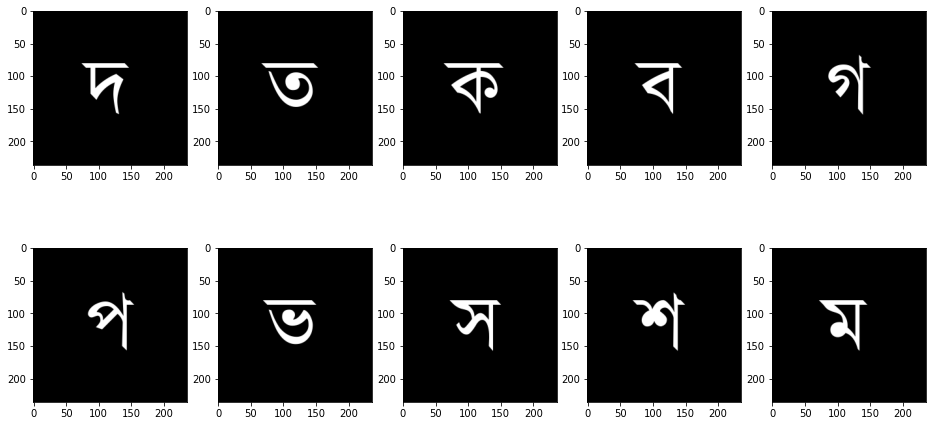

In [68]:
f, ax = plt.subplots(2, 5, figsize=(16,8))
ax = ax.flatten()

for i in range(10):
    ax[i].imshow(image_from_char(grapheme_roots['component'].iloc[i]), cmap = 'Greys')

In [62]:
#counts of each class - here it shows top 10 vowel diacritics
vowel_diacritics = get_top_n(train_df, 'vowel_diacritic', 10)
vowel_diacritics

,index,component,count
0,0,ং,41508
1,1,ঃ,36886
7,7,ঊ,28723
2,2,অ,25967
4,4,ই,18848
3,3,আ,16152
9,9,এ,16032
5,5,ঈ,5297
6,6,উ,4336
10,10,ঐ,3563


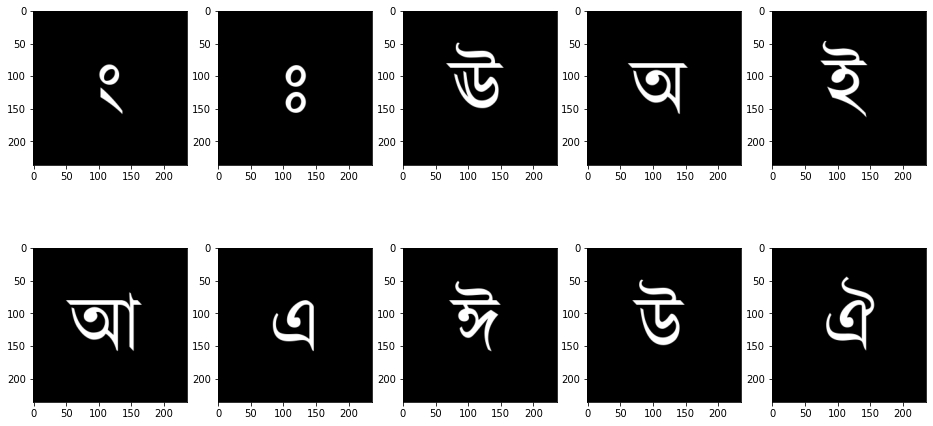

In [70]:
f, ax = plt.subplots(2, 5, figsize=(16,8))
ax = ax.flatten()

for i in range(10):
    ax[i].imshow(image_from_char(vowel_diacritics['component'].iloc[i]), cmap = 'Greys')

In [61]:
#counts of each class - here it shows top 10 consonant diacritics
consonant_diacritics = get_top_n(train_df, 'consonant_diacritic', 10)
consonant_diacritics

,index,component,count
0,0,ং,125278
2,2,অ,23465
5,5,ঈ,21397
4,4,ই,21270
1,1,ঃ,7424
6,6,উ,1387
3,3,আ,619


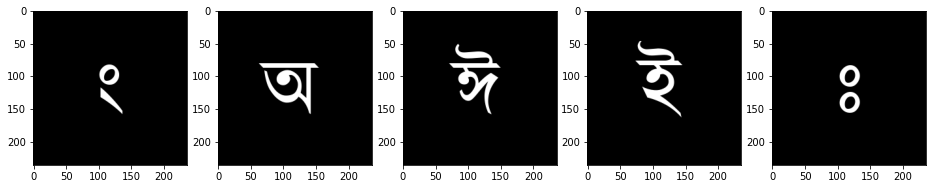

In [73]:
f, ax = plt.subplots(1, 5, figsize=(16,8))
ax = ax.flatten()

for i in range(5):
    ax[i].imshow(image_from_char(consonant_diacritics['component'].iloc[i]), cmap = 'Greys')

In [79]:
train_df

,image_id,grapheme_root,vowel_diacritic,consonant_diacritic,grapheme
0,Train_0,15,9,5,ক্ট্রো
1,Train_1,159,0,0,হ
2,Train_2,22,3,5,খ্রী
3,Train_3,53,2,2,র্টি
4,Train_4,71,9,5,থ্রো
...,...,...,...,...,...
200835,Train_200835,22,7,2,র্খে
200836,Train_200836,65,9,0,ত্তো
200837,Train_200837,2,1,4,অ্যা
200838,Train_200838,152,9,0,স্নো


In [13]:
train_df[['grapheme_root', 'vowel_diacritic', 'consonant_diacritic']] = train_df[['grapheme_root', 'vowel_diacritic', 'consonant_diacritic']].astype('uint8')

In [15]:
train_df.dtypes

image_id               object
grapheme_root           uint8
vowel_diacritic         uint8
consonant_diacritic     uint8
grapheme               object
dtype: object

In [16]:
#Reading Parquet file  - contains Image id and flattened image
#Only train_image_data_0.parquet is considered here
df = pd.read_parquet('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/train_image_data_0.parquet')
df.head()

,image_id,0,1,2,3,4,5,6,7,8,...,32322,32323,32324,32325,32326,32327,32328,32329,32330,32331
0,Train_0,254,253,252,253,251,252,253,251,251,...,253,253,253,253,253,253,253,253,253,251
1,Train_1,251,244,238,245,248,246,246,247,251,...,255,255,255,255,255,255,255,255,255,254
2,Train_2,251,250,249,250,249,245,247,252,252,...,254,253,252,252,253,253,253,253,251,249
3,Train_3,247,247,249,253,253,252,251,251,250,...,254,254,254,254,254,253,253,252,251,252
4,Train_4,249,248,246,246,248,244,242,242,229,...,255,255,255,255,255,255,255,255,255,255


In [19]:
HEIGHT = 137
WIDTH = 236

#reading from parquet files
def load_as_npa(file):
    df = pd.read_parquet(file)
    return df.iloc[:, 0], df.iloc[:, 1:].values.reshape(-1, HEIGHT, WIDTH)

def image_from_char(char):
    image = Image.new('RGB', (WIDTH, HEIGHT))
    draw = ImageDraw.Draw(image)
    myfont = ImageFont.truetype('/kaggle/input/bengaliai/hind_siliguri_normal_500.ttf', 120)
    w, h = draw.textsize(char, font=myfont)
    draw.text(((WIDTH - w) / 2,(HEIGHT - h) / 2), char, font=myfont)

    return image

In [20]:
image_ids0, images0 = load_as_npa('C:/Studies/Masters/Spring2019/Machine Learning/Final Project/bengaliai-cv19/train_image_data_0.parquet')

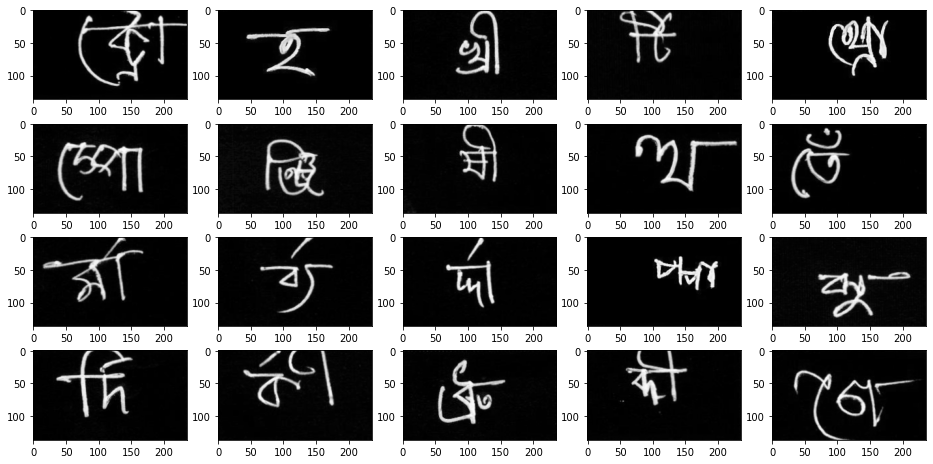

In [21]:
f, ax = plt.subplots(4, 5, figsize=(16, 8))
ax = ax.flatten()

for i in range(20):
    ax[i].imshow(images0[i], cmap='Greys')

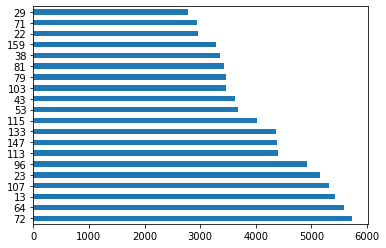

In [33]:
#visualizing the distribution - bar charts
train_df['grapheme_root'].value_counts()[:20].plot(kind='barh')

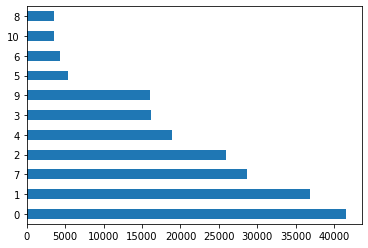

In [34]:
train_df['vowel_diacritic'].value_counts()[:20].plot(kind='barh')

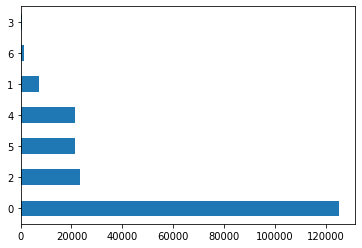

In [36]:
train_df['consonant_diacritic'].value_counts()[:10].plot(kind='barh')

In [38]:
#Using plotly
fig = go.Figure(data=[go.Histogram(x=train_df['grapheme_root'])])
fig.update_layout(title_text='Grapheme Roots')
fig.show()

In [40]:
fig = go.Figure(data=[go.Histogram(x=train_df['vowel_diacritic'])])
fig.update_layout(title_text='Vowel Diacritics')
fig.show()

In [41]:
fig = go.Figure(data=[go.Histogram(x=train_df['consonant_diacritic'])])
fig.update_layout(title_text='Consonant Diacritics')
fig.show()